In [2]:
# Loading R packages
library(reshape)
library(ggplot2)
library(phyloseq)
library(plyr)
library(dplyr)
library(plotly)
library(wesanderson)

Warning message:
“package ‘ggplot2’ was built under R version 3.3.2”
Attaching package: ‘plyr’

The following objects are masked from ‘package:reshape’:

    rename, round_any


Attaching package: ‘dplyr’

The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following object is masked from ‘package:reshape’:

    rename

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Warning message:
“package ‘plotly’ was built under R version 3.3.2”
Attaching package: ‘plotly’

The following objects are masked from ‘package:plyr’:

    arrange, mutate, rename, summarise

The following object is masked from ‘package:ggplot2’:

    last_plot

The following object is masked from ‘package:reshape’:

    rename

The following object is masked from ‘package:stats’:

    filter

The following object is

In [14]:
# Importing the dataset
ps = import_biom("../../data/Seq_data/QIIME_maxee2/OTU_table/feature-table-metaD-tax2.biom",parseFunction=parse_taxonomy_greengenes, "../../data/Seq_data/QIIME_maxee2/OTU_table/Trees3/fulltree2.rooted.tre")

Warning message in strsplit(msg, "\n"):
“input string 1 is invalid in this locale”

In [15]:
# Setting various parameters as combined values
sample_data(ps)$pH = as.numeric(sample_data(ps)$pH)
sample_data(ps)$Total_C_pct = as.numeric(sample_data(ps)$TC_pct)
sample_data(ps)$Total_N_pct = as.numeric(sample_data(ps)$Total_N_pct)
sample_data(ps)$Total_S_pct = as.numeric(sample_data(ps)$Total_S_pct)
sample_data(ps)$Burn_Severity_Index= as.numeric(sample_data(ps)$Burn_Severity_Index)
sample_data(ps)$CBI= as.numeric(sample_data(ps)$CBI)
sample_data(ps)$RBR= as.numeric(sample_data(ps)$RBR)
sample_data(ps)$CFSI= as.numeric(sample_data(ps)$CFSI)
sample_data(ps)$fwi= as.numeric(sample_data(ps)$fwi)
sample_data(ps)$bui= as.numeric(sample_data(ps)$bui)
sample_data(ps)$isi= as.numeric(sample_data(ps)$isi)
sample_data(ps)$Mean_Duff_Depth_cm = as.numeric(sample_data(ps)$Mean_Duff_Depth_cm)
sample_data(ps)$Understory_CBI= as.numeric(sample_data(ps)$Understory_CBI)
sample_data(ps)$Overstory_CBI= as.numeric(sample_data(ps)$Overstory_CBI)
sample_data(ps)$Overstory_CBI= as.numeric(sample_data(ps)$Overstory_CBI)
sample_data(ps)$Dead_Trees= as.numeric(sample_data(ps)$Dead_Trees)
sample_data(ps)$TotalSeqs=sample_sums(ps)

Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”Warning message in eval(expr, envir, e

In [16]:
# Pulling out samples from this project only
ps.wb = prune_samples(sample_data(ps)$Project_ID=="WB15", ps)
ps.wb = prune_samples(sample_data(ps.wb)$Org_or_Min %in% c("O","M"), ps.wb)

In [17]:
# Merging lab replicates for analysis
ps.merged = merge_samples(ps.wb, "Sample_ID")

# This sums the OTUs for each sample ID, and averages the sample data
# That's an issue for the non-numeric sample data, so we have to add it back in.
# The code below is probably inefficient, but it works correctly.
names=colnames(sample_data(ps.wb))
notcommonnames = c('Sample_Name','Replicate','Project_ID','Fwd_Primer_Barcode','Rev_Primer_Barcode','Revcomp_Rev_Primer_Barcode')
commonnames = names[(names %in% notcommonnames)]
common_sample_data = sample_data(ps.wb)[ , -which(names(sample_data(ps.wb)) %in% commonnames)]
commonrownames=row.names(sample_data(ps.merged))
common_sample_data2 = common_sample_data[which(common_sample_data$Sample_ID %in% commonrownames),]
common_sample_data2 = common_sample_data2[!duplicated(common_sample_data2$Sample_ID), ]
row.names(common_sample_data2) = common_sample_data2$Sample_ID
sample_data(ps.merged)=common_sample_data2
sample_data(ps.merged)$TotalSeqs = sample_sums(ps.merged)

Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMethod(object):
“NAs introduced by coercion”Warning message in asMeth

In [18]:
ps.merged.norm = transform_sample_counts(ps.merged, function(x) x / sum(x) )
ps = transform_sample_counts(ps, function(x) x / sum(x) )

In [19]:
ps.merged.norm

phyloseq-class experiment-level object
otu_table()   OTU Table:         [ 9092 taxa and 102 samples ]
sample_data() Sample Data:       [ 102 samples by 66 sample variables ]
tax_table()   Taxonomy Table:    [ 9092 taxa by 7 taxonomic ranks ]
phy_tree()    Phylogenetic Tree: [ 9092 tips and 9089 internal nodes ]

In [20]:
df = psmelt(ps.merged)

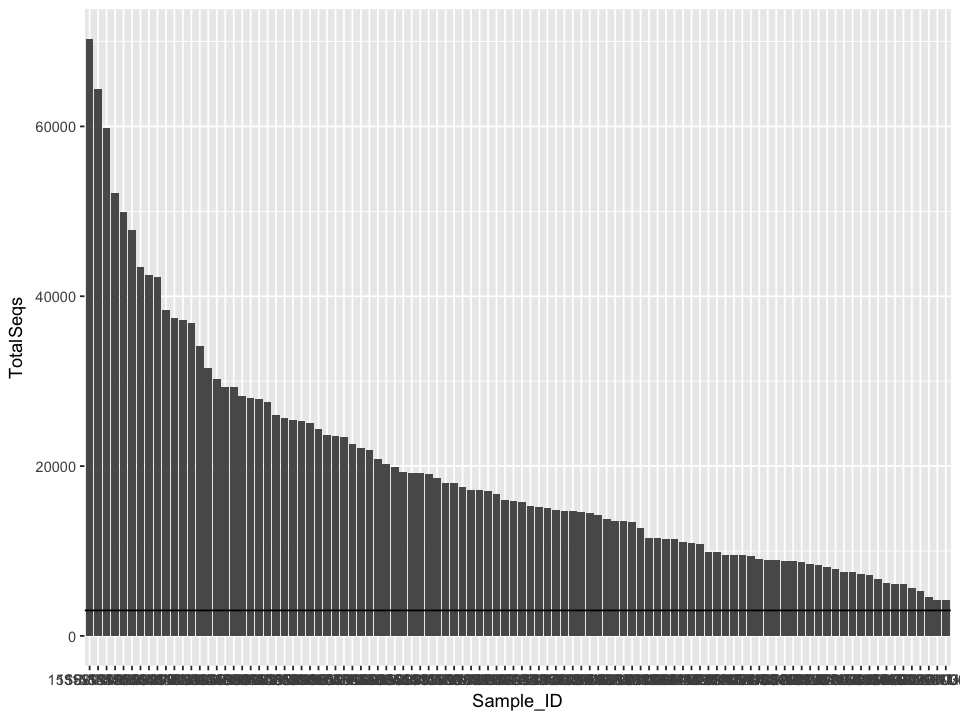

In [129]:
d = df %>%
    group_by(Sample_ID,TotalSeqs)%>%
    summarize()%>%
    arrange(-TotalSeqs)
d$Sample_ID = ordered(d$Sample_ID,levels=d$Sample_ID)
p = ggplot(d)
p = p + geom_bar(aes(x=Sample_ID, y=TotalSeqs), stat="identity")
p = p + geom_hline(yintercept=3000)
p

## Ordination plots

In [21]:
minseqs = 3000
ps.merged.norm.min = prune_samples(sample_data(ps.merged.norm)$TotalSeqs>minseqs,ps.merged.norm)

In [22]:
Plotter = function(Org_or_Min,Land_Class){
    ps.plot = prune_samples(sample_data(ps.merged.norm.min)$Org_or_Min == Org_or_Min & sample_data(ps.merged.norm.min)$Land_Class == Land_Class, ps.merged.norm.min)
    trtmt = paste(levels(as.factor(sample_data(ps.plot)$Org_or_Min)),levels(as.factor(sample_data(ps.plot)$Land_Class)))
    ord = ordinate(ps.plot, method = "PCoA", distance = "unifrac", weighted=TRUE)
    resultslist = list(ps.plot,ord,trtmt)
    return(resultslist)
}

In [23]:
factors = expand.grid(Org_or_Min=c("O","M"),Land_Class=c("Upland","Wetland"))
#factors = factors[1:3,]
factors

Org_or_Min,Land_Class
O,Upland
M,Upland
O,Wetland
M,Wetland


In [24]:
PCoAs = mlply(factors,Plotter)

In [27]:
ActualPlotter = function(physeq,ord,trtmt){
    p = plot_ordination(physeq, ord, color = "CBI", shape = "Veg_Comm", axes=c(1,2))
    p = p  + geom_point(size=3.5) + scale_colour_gradient(low="yellow",high="red")
    p = p + guides(colour = guide_legend(), shape = guide_legend(""))
    p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))
    p = p + ggtitle(label=trtmt)
    return(p)
}

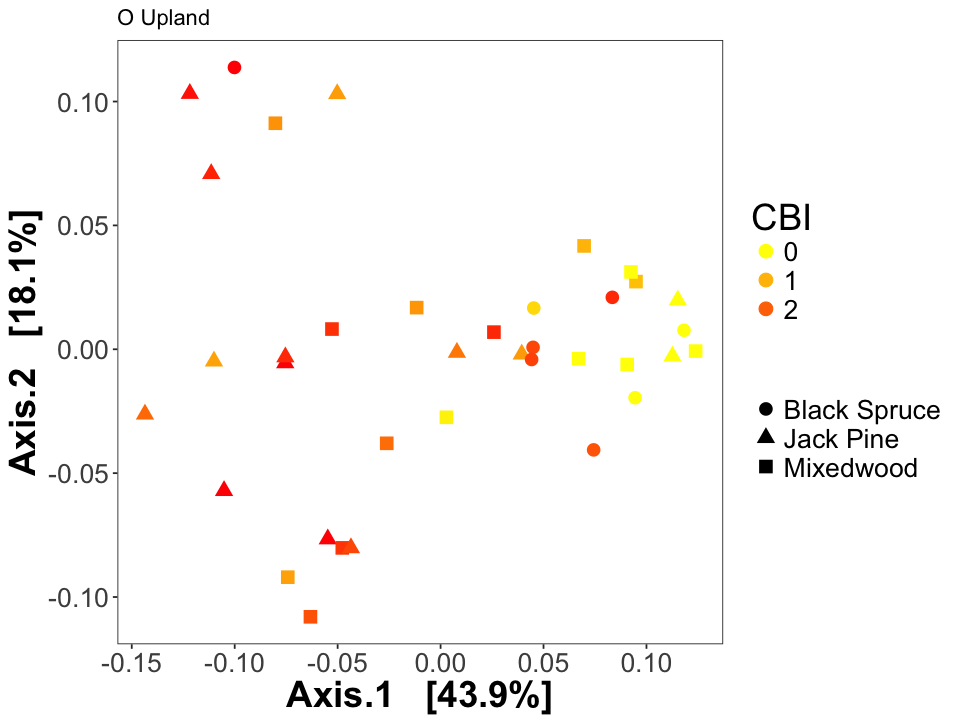

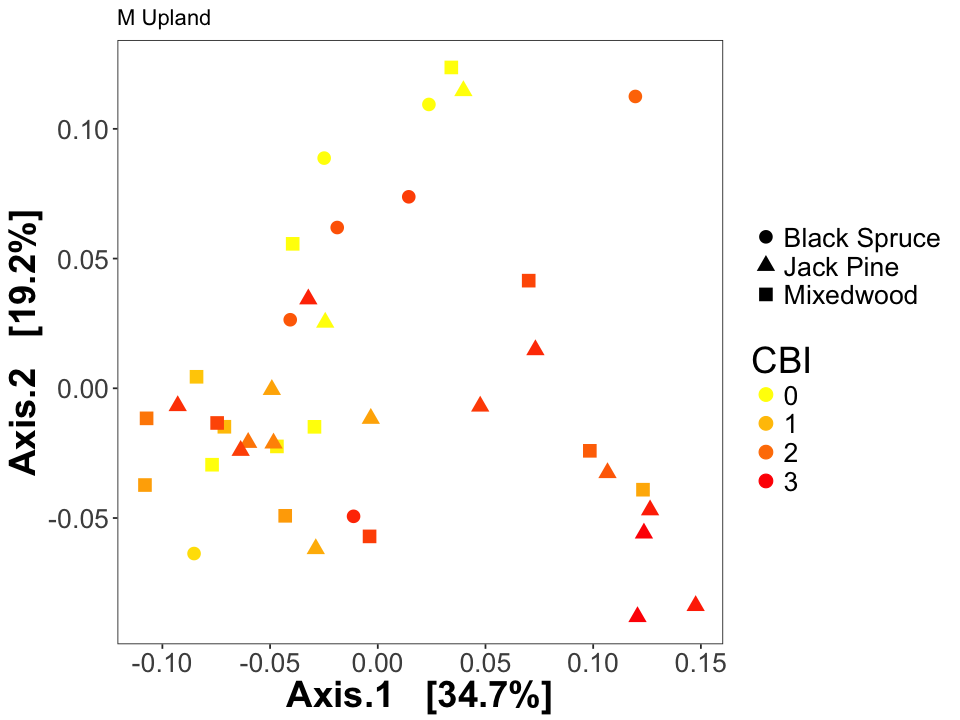

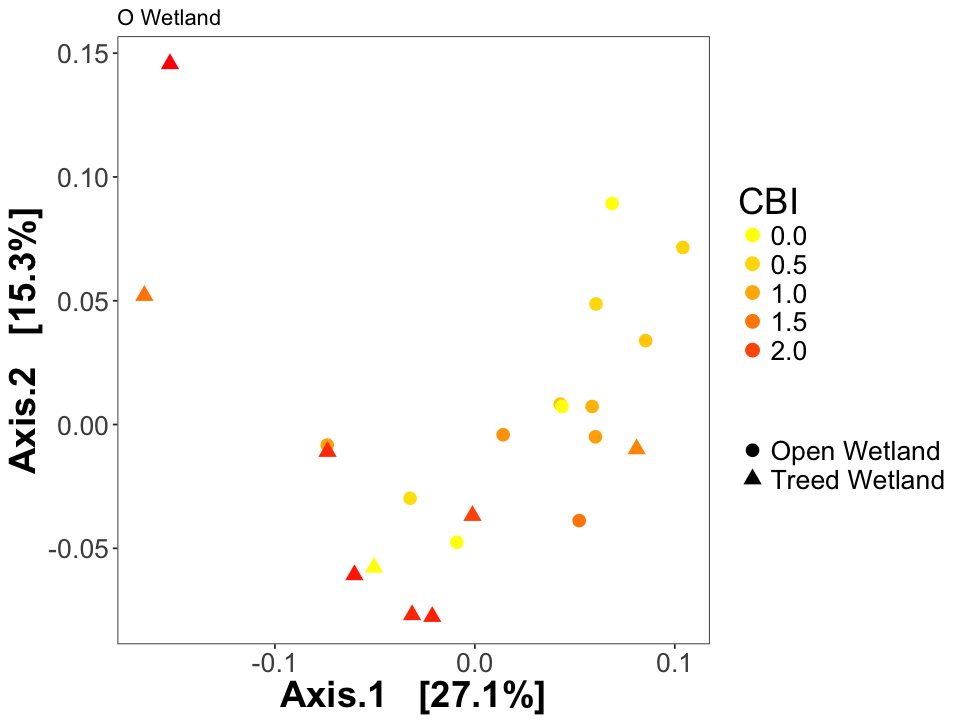

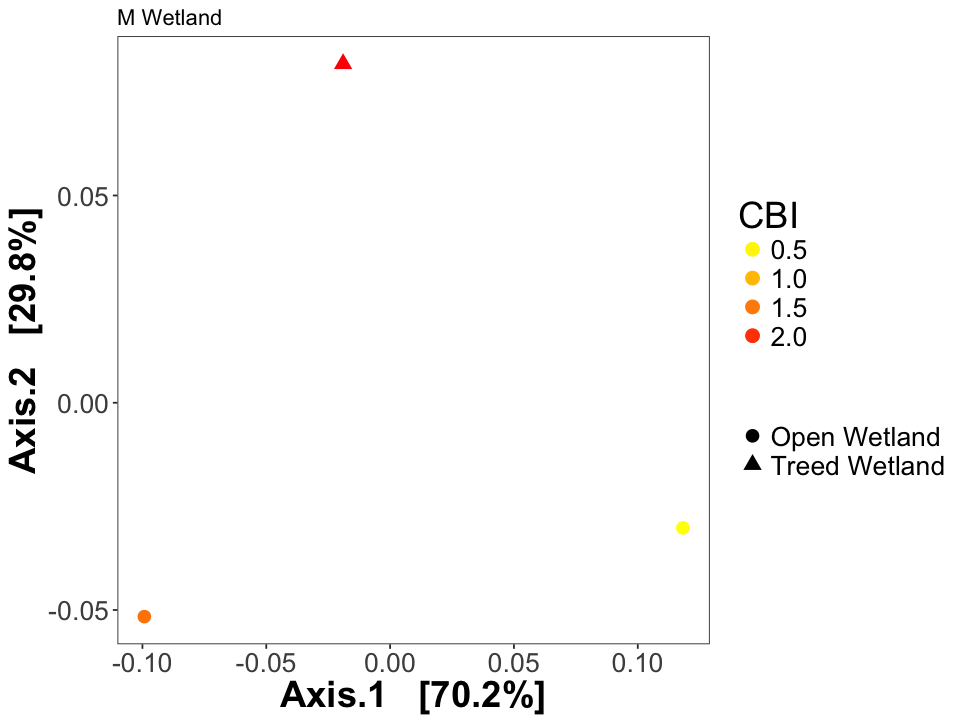

In [28]:
ActualPlotter(PCoAs[[1]][[1]],PCoAs[[1]][[2]],PCoAs[[1]][[3]])
ActualPlotter(PCoAs[[2]][[1]],PCoAs[[2]][[2]],PCoAs[[2]][[3]])
ActualPlotter(PCoAs[[3]][[1]],PCoAs[[3]][[2]],PCoAs[[3]][[3]])
ActualPlotter(PCoAs[[4]][[1]],PCoAs[[4]][[2]],PCoAs[[4]][[3]])

In [57]:
ord = ordinate(ps.merged.norm.min, method = "NMDS", distance = "bray", weighted=TRUE)

Run 0 stress 0.1678057 
Run 1 stress 0.1679753 
... Procrustes: rmse 0.005950566  max resid 0.04770683 
Run 2 stress 0.1684256 
Run 3 stress 0.1678297 
... Procrustes: rmse 0.00167888  max resid 0.01312909 
Run 4 stress 0.1678041 
... New best solution
... Procrustes: rmse 0.0009401606  max resid 0.006059983 
... Similar to previous best
Run 5 stress 0.1678043 
... Procrustes: rmse 0.0008579076  max resid 0.00601552 
... Similar to previous best
Run 6 stress 0.1678041 
... New best solution
... Procrustes: rmse 0.000212261  max resid 0.001477126 
... Similar to previous best
Run 7 stress 0.1678273 
... Procrustes: rmse 0.001408339  max resid 0.01108065 
Run 8 stress 0.1684007 
Run 9 stress 0.1678282 
... Procrustes: rmse 0.001676272  max resid 0.0130005 
Run 10 stress 0.1678041 
... New best solution
... Procrustes: rmse 0.0002249113  max resid 0.001549655 
... Similar to previous best
Run 11 stress 0.1683971 
Run 12 stress 0.168415 
Run 13 stress 0.1678039 
... New best solution
... P

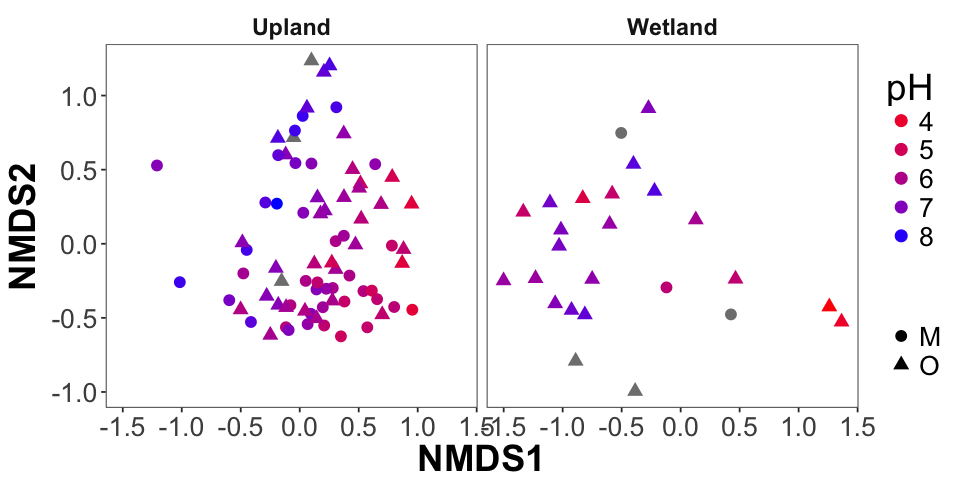

In [59]:
options(repr.plot.width=8, repr.plot.height=4)

p = plot_ordination(ps.merged.norm.min, ord, color = "pH", shape = "Org_or_Min",  axes=c(1,2))
p = p  + geom_point(size=3) + scale_colour_gradient(low="red",high="blue")
p = p + guides(colour = guide_legend(), shape = guide_legend(""))
p = p + theme_bw() +
  theme(
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))
p = p + facet_wrap(~Land_Class)
p

## Plotting soil properties

In [92]:
SoilPlotter = function(ps,trtmt){
    df = sample_data(ps)
    # Setting various parameters as combined values
    df$pH = as.numeric(df$pH)
    df$Total_C_pct = as.numeric(df$TC_pct)
    df$Total_N_pct = as.numeric(df$Total_N_pct)
    df$S_mg_kg = as.numeric(df$S_mg_kg)
    df$Total_S_pct = as.numeric(df$Total_S_pct)
    df$Burn_Severity_Index= as.numeric(df$Burn_Severity_Index)
    df$CBI= as.numeric(df$CBI)
    df$RBR= as.numeric(df$RBR)
    df$CFSI= as.numeric(df$CFSI)
    df$Mean_Duff_Depth_cm = as.numeric(df$Mean_Duff_Depth_cm)
    df$Understory_CBI= as.numeric(df$Understory_CBI)
    df$Overstory_CBI= as.numeric(df$Overstory_CBI)
    df$Overstory_CBI= as.numeric(df$Overstory_CBI)
    df$Dead_Trees= as.numeric(df$Dead_Trees)
    df$Pct_Exposed_Mineral= as.numeric(df$Pct_Exposed_Mineral)
    df$dc = as.numeric(df$dc)
    df$fwi = as.numeric(df$fwi)
    df$dmc = as.numeric(df$dmc)
    df$ffmc = as.numeric(df$ffmc)
    p = ggplot(df, aes(x=pH,y=CBI, shape=Burned_Unburned, colour=Veg_Comm))
    p = p + geom_point(size=3)
    p = p + ggtitle(label=trtmt)
    p = p + scale_colour_manual(values=c(wes_palette("Darjeeling"),wes_palette("Darjeeling2")))
    return(p)
}

Warning message in SoilPlotter(PCoAs[[1]][[1]], PCoAs[[1]][[3]]):
“NAs introduced by coercion”Warning message in SoilPlotter(PCoAs[[1]][[1]], PCoAs[[1]][[3]]):
“NAs introduced by coercion”Warning message:
“Removed 2 rows containing missing values (geom_point).”

Warning message in SoilPlotter(PCoAs[[2]][[1]], PCoAs[[2]][[3]]):
“NAs introduced by coercion”

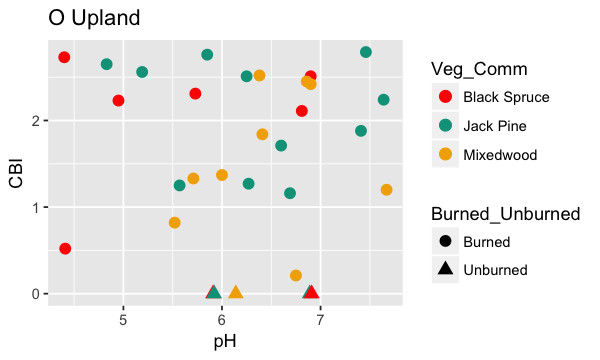

Warning message in SoilPlotter(PCoAs[[3]][[1]], PCoAs[[3]][[3]]):
“NAs introduced by coercion”Warning message in SoilPlotter(PCoAs[[3]][[1]], PCoAs[[3]][[3]]):
“NAs introduced by coercion”Warning message:
“Removed 2 rows containing missing values (geom_point).”

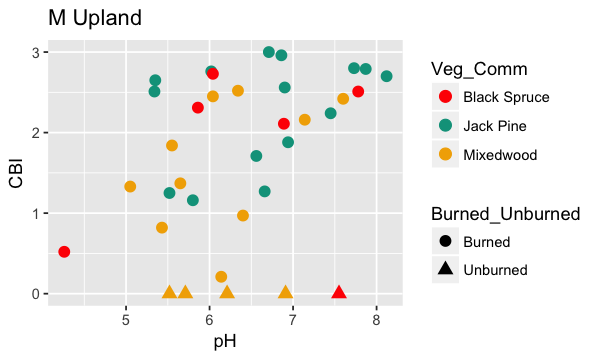

Warning message in SoilPlotter(PCoAs[[4]][[1]], PCoAs[[4]][[3]]):
“NAs introduced by coercion”Warning message in SoilPlotter(PCoAs[[4]][[1]], PCoAs[[4]][[3]]):
“NAs introduced by coercion”Warning message:
“Removed 2 rows containing missing values (geom_point).”

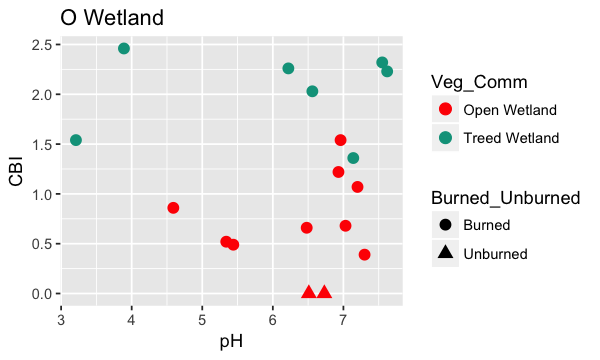

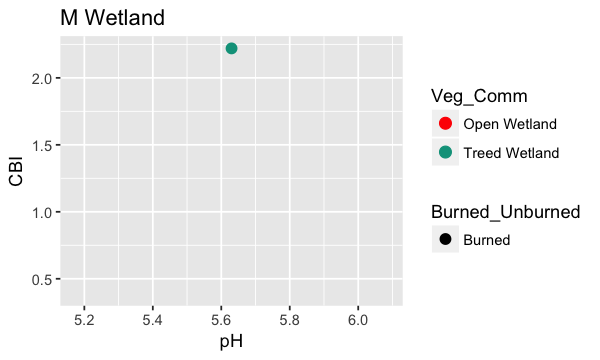

In [93]:
options(repr.plot.width=5, repr.plot.height=3)
SoilPlotter(PCoAs[[1]][[1]],PCoAs[[1]][[3]])
SoilPlotter(PCoAs[[2]][[1]],PCoAs[[2]][[3]])
SoilPlotter(PCoAs[[3]][[1]],PCoAs[[3]][[3]])
SoilPlotter(PCoAs[[4]][[1]],PCoAs[[4]][[3]])

Regular ordinations

In [61]:
ord = ordinate(ps.merged.norm.min, method = "PCoA", distance = "unifrac", weighted=TRUE)

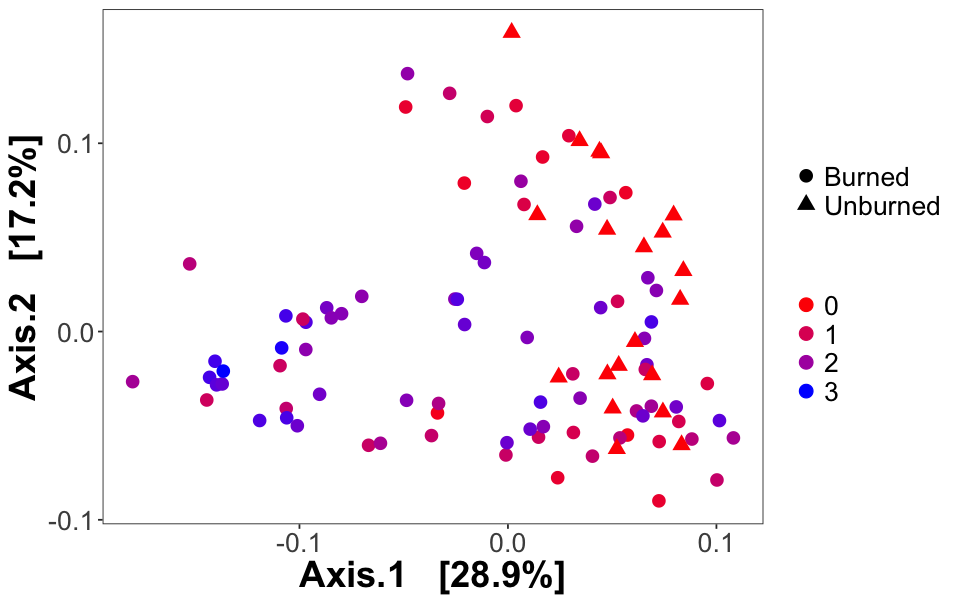

In [62]:
options(repr.plot.width=8, repr.plot.height=5)
p = plot_ordination(ps.merged.norm.min, ord, color = "CBI", shape = "Burned_Unburned", axes=c(1,2))

p = p  + geom_point(size=3.5) + scale_colour_gradient(low="red",high="blue")

p = p + guides(colour = guide_legend(""), shape = guide_legend(""))

p = p + theme_bw() +
  theme(
      #legend.position = "right",
      #legend.justification=c(0,1),
      #legend.position=c(0.05,0.6),
      #legend.box.just= "left",
    plot.background = element_blank()
   ,panel.grid.major = element_blank()
   ,panel.grid.minor = element_blank()
    ,strip.text.x = element_text(size=14, face="bold"),
        axis.title = element_text(size=22, face="bold"),
        axis.text = element_text(size=16),
        legend.text = element_text(size=16),
        legend.title = element_text(size = 22),
        strip.background = element_rect(colour="white", fill="white"))

#p = p + facet_wrap(~Fire_ID)

p

## 3-D Ordination plots

In [46]:
ord = ordinate(ps.merged.norm.min, method = "NMDS", distance = "bray", weighted=TRUE, k=3, trymax=1000)

Run 0 stress 0.1237956 
Run 1 stress 0.1243503 
Run 2 stress 0.1275431 
Run 3 stress 0.1239872 
... Procrustes: rmse 0.03709774  max resid 0.2161317 
Run 4 stress 0.1264263 
Run 5 stress 0.1290576 
Run 6 stress 0.1249228 
Run 7 stress 0.1249215 
Run 8 stress 0.1247944 
Run 9 stress 0.1239906 
... Procrustes: rmse 0.03695125  max resid 0.2160066 
Run 10 stress 0.1245203 
Run 11 stress 0.1245965 
Run 12 stress 0.1236105 
... New best solution
... Procrustes: rmse 0.02304131  max resid 0.1273057 
Run 13 stress 0.1232233 
... New best solution
... Procrustes: rmse 0.02711565  max resid 0.126027 
Run 14 stress 0.1244003 
Run 15 stress 0.1264417 
Run 16 stress 0.1232236 
... Procrustes: rmse 0.0007515589  max resid 0.00499511 
... Similar to previous best
Run 17 stress 0.1245702 
Run 18 stress 0.1250639 
Run 19 stress 0.1237583 
Run 20 stress 0.1238546 
*** Solution reached


In [47]:
NMDS.coords = data.frame(ord$points)
# Extracting the coordinates from the ordination
NMDS.coords = merge(NMDS.coords,sample_data(ps.merged.norm.min), by = 0)
# Merging it with the sample data, by rowname (the same)
NMDS.coords = NMDS.coords %>%
    filter(Org_or_Min %in% c("O","M"))
plot_ly(NMDS.coords, x = NMDS.coords$MDS1, y = NMDS.coords$MDS2, z = NMDS.coords$MDS3, color = ~NMDS.coords$pH
        #, colors = c("red3","tan4","darkorange","skyblue3","chartreuse4")
        , symbol = NMDS.coords$Org_or_Min, symbols = 1:2
        #, alpha = 0.5
       )%>%
    layout(scene = list(xaxis = list(title = "NMDS1"), yaxis = list(title = "NMDS2"),
          zaxis = list(title = "NMDS3")))%>%
    add_trace(type="scatter3d", mode="markers")

HTML widgets cannot be represented in plain text (need html)

In [93]:
# Running PCoA ordination
ord = ordinate(ps.merged.norm.min, method = "PCoA", distance = "bray", weighted=TRUE)
ord.coords = data.frame(ord$vectors)
var = ord$values$Eigenvalues / sum(ord$values$Eigenvalues)

In [94]:
# Extracting the coordinates from the ordination
ord.plot = merge(ord.coords,sample_data(ps.merged.norm.min), by = 0)
# Merging it with the sample data, by rowname (the same)
ord.plot = ord.plot %>%
    filter(Org_or_Min %in% c("O","M"))
plot_ly(ord.plot, x = ord.plot$Axis.1, y = ord.plot$Axis.2, z = ord.plot$Axis.3
        , color = ~ord.plot$Burn_Severity_Index
        #, colors = c("red3","tan4","darkorange","skyblue3","chartreuse4")
        , symbol = ord.plot$Land_Class, symbols = 1:2
        #, alpha = 0.5
       )%>%
    layout(scene = list(xaxis = list(title = paste("PCo1 (",round(var[1]*100,1),"%)",sep="")), 
                        yaxis = list(title = paste("PCo2 (",round(var[2]*100,1),"%)",sep="")),
                        zaxis = list(title = paste("PCo3 (",round(var[3]*100,1),"%)",sep=""))))%>%
    add_trace(type="scatter3d", mode="markers")

HTML widgets cannot be represented in plain text (need html)

In [66]:
# Extracting the coordinates from the ordination
ord.plot = merge(ord.coords,sample_data(ps.merged.norm.min), by = 0)
# Merging it with the sample data, by rowname (the same)
ord.O = ord.plot[ord.plot$Org_or_Min=="O",]
ord.M = ord.plot[ord.plot$Org_or_Min=="M",]

plotfunction = function (ord){
    plot_ly(ord, x = ord$Axis.1, y = ord$Axis.2, z = ord$Axis.3
        , color = ~ord$Burn_Severity_Index
        #, colors = c("red3","tan4","darkorange","skyblue3","chartreuse4")
        , symbol = ord$Land_Class, symbols = 1:2
        #, alpha = 0.5
       )%>%
    layout(scene = list(xaxis = list(title = paste("PCo1 (",round(var[1]*100,1),"%)",sep="")), 
                        yaxis = list(title = paste("PCo2 (",round(var[2]*100,1),"%)",sep="")),
                        zaxis = list(title = paste("PCo3 (",round(var[3]*100,1),"%)",sep=""))))%>%
    add_trace(type="scatter3d", mode="markers")
}

pO = plotfunction(ord.O)
pM = plotfunction(ord.M)

pO
pM

HTML widgets cannot be represented in plain text (need html)

HTML widgets cannot be represented in plain text (need html)

In [115]:
# Extracting the coordinates from the ordination

# Merging it with the sample data, by rowname (the same)

plotfunction = function (physeq, dist="unifrac", color="CBI", symbol="Org_or_Min"){
    #print(physeq)
    sampledata=sample_data(physeq)
    ord = ordinate(physeq, method = "PCoA", distance = dist, weighted=TRUE)
    #print(ord$values$Eigenvalues)
    var = ord$values$Eigenvalues / sum(ord$values$Eigenvalues)
    #print(head(ord$vectors[,1:4]))
    plotdf = ord$vectors
    plotdf = merge(plotdf,sampledata, by = 0)
    print(head(plotdf[,1:4]))
    plot_ly(plotdf, x = plotdf$Axis.1, y = plotdf$Axis.2, z = plotdf$Axis.3
        , color = ~plotdf$color
        , symbol = plotdf$symbol, symbols = 1:2
       )%>%
    layout(scene = list(xaxis = list(title = paste("PCo1 (",round(var[1]*100,1),"%)",sep="")), 
                        yaxis = list(title = paste("PCo2 (",round(var[2]*100,1),"%)",sep="")),
                        zaxis = list(title = paste("PCo3 (",round(var[3]*100,1),"%)",sep=""))))%>%
    add_trace(type="scatter3d", mode="markers")
    return(p)
}

psMix = prune_samples(sample_data(ps.merged.norm.min)$Veg_Comm == "Mixedwood",ps.merged.norm.min)
psJP = prune_samples(sample_data(ps.merged.norm.min)$Veg_Comm == "Jack Pine",ps.merged.norm.min)

plotfunction(psMix, dist="bray")
plotfunction(psJP, dist="bray")

   Row.names      Axis.1      Axis.2      Axis.3
1 15S-NT-24M  0.18861883  0.06919110  0.01504619
2 15S-NT-24O -0.16006803 -0.02410277 -0.21934781
3 15S-NT-39M  0.24724082  0.14482732 -0.11872962
4 15S-NT-39O  0.15717363  0.10606933 -0.31514372
5 15S-NT-40M  0.22733762 -0.29024868  0.03139653
6 15S-NT-40O -0.08534365 -0.28551217 -0.18312796


HTML widgets cannot be represented in plain text (need html)

   Row.names       Axis.1       Axis.2       Axis.3
1 15S-NT-22M -0.368558784  0.110944011 -0.067151594
2 15S-NT-22O -0.269254247 -0.104680401  0.308004684
3 15S-NT-23M -0.280003477 -0.213050068  0.153517659
4 15S-NT-23O  0.352884976 -0.138761192  0.019904748
5 15S-NT-27M -0.366962230 -0.006096388 -0.002823496
6 15S-NT-27O -0.007881768 -0.083778922  0.134921757


HTML widgets cannot be represented in plain text (need html)

## Holden et al. paper plots

In [86]:
d = psmelt(ps.merged.norm.min)

In [87]:
df = d %>%
    group_by(Sample,Phylum,CBI,RBR)%>%
    summarize(TaxPresent = ifelse(sum(Abundance)>0,1,0))%>%
    filter(TaxPresent>0)%>%
    group_by(Phylum)%>%
    summarize(MeanCBI=mean(CBI),MeanRBR=mean(RBR))
df

Phylum,MeanCBI,MeanRBR
[Caldithrix],0.5200000,-5.975622
[Thermi],1.3300000,163.903909
AC1,0.5200000,-5.975622
Acidobacteria,1.4724242,285.573761
Actinobacteria,1.4697000,284.995184
AD3,1.7838710,352.779181
Armatimonadetes,1.5536486,303.091018
Bacteroidetes,1.4845455,288.013384
BHI80-139,1.5580000,271.796830
BRC1,1.8566667,373.879236


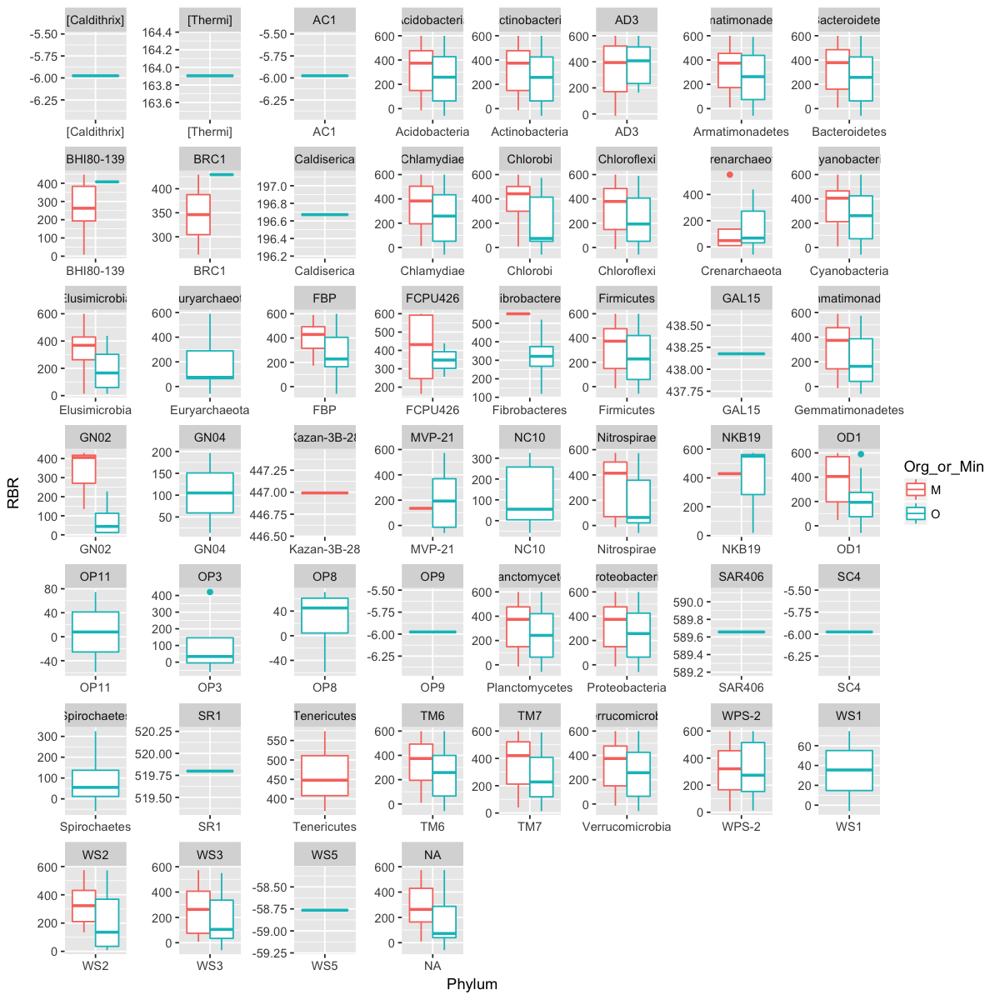

In [91]:
options(repr.plot.width=10, repr.plot.height=10)
df = d %>%
    group_by(Sample,Phylum,CBI,RBR,Org_or_Min)%>%
    summarize(TaxPresent = ifelse(sum(Abundance)>0,1,0))%>%
    filter(TaxPresent>0)

p = ggplot(df, aes(x=Phylum, color=Org_or_Min+Burned_Unburned)) + geom_boxplot(aes(y=RBR)) + facet_wrap(~Phylum, scales="free")
p